<a href="https://colab.research.google.com/github/guaaaaa/Intel_image_classification/blob/master/Intel_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [55]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor, Lambda, Compose, Resize, Normalize
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Set up device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


Data extracted from https://www.kaggle.com/datasets/puneet6060/intel-image-classification?resource=download

In [ ]:
# Unzip data file
from pathlib import Path
import zipfile
import os

def unzip_file(zip_path):
   image_path = Path(zip_path)
   extract_path = image_path.parent

   with zipfile.ZipFile(image_path, 'r') as zip_ref:
       zip_ref.extractall(extract_path)

zip_path = "data/data.zip"
unzip_file(zip_path)

In [ ]:
# Data path setup
train_dir = "data/seg_train/seg_train"
test_dir = "data/seg_test/seg_test"

In [5]:
# Get transform (from ResNet18)
weights = torchvision.models.ResNet18_Weights.DEFAULT
transformer = torchvision.models.resnet18(weights=weights).to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 159MB/s]


In [6]:
# Convert data to dataloader
train_data = datasets.ImageFolder(root=train_dir, transform=weights.transforms())
test_data = datasets.ImageFolder(root=test_dir, transform=weights.transforms())

train_dataloader = DataLoader(dataset=train_data, batch_size=32, shuffle=True)
test_dataloader = DataLoader(dataset=test_data, batch_size=32, shuffle=False)

In [7]:
# Check dataloaders
print(f'Classes: {train_data.classes}')
print(f'Number of train dataloader: {len(train_dataloader)} | Number of test dataloader: {len(test_dataloader)}')

Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of train dataloader: 403 | Number of test dataloader: 94


In [8]:
# Get model
model = torchvision.models.resnet18(weights=weights).to(device)

In [9]:
!pip install torchinfo

In [10]:
# Freeze Previous layers and modify the Linear layer
model.conv1.requires_grad_(False)
model.bn1.requires_grad_(False)
model.maxpool.requires_grad_(False)
model.layer1.requires_grad_(False)
model.layer2.requires_grad_(False)
model.layer3.requires_grad_(False)
model.layer4.requires_grad_(False)
model.avgpool.requires_grad_(False)
model.fc = nn.Linear(in_features=512, out_features=6, bias=True) # 6 classes
model = model.to(device)

In [11]:
# See model architecture
import torchinfo
# Get model summary
import torchinfo
from torchinfo import summary
summary(model,
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 6]              --                   Partial
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   (9,408)              False
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   (128)                False
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 64, 56, 56]     --                   False
│    └─BasicBlock (0)                    [32, 64, 56, 56]     [32, 64, 56, 56]     --                   False
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     (36,864)             False
│    │    

In [12]:
# Setup loss and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

In [13]:
# Create writer
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [14]:
from tqdm.auto import tqdm

# Training
def train(train_loader, test_loader, model, loss_fn, optimizer, writer, epochs, device):
  results = {"train_loss": [],
             "test_loss": [],
             "train_acc": [],
             "test_acc": []}

  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = 0, 0
    test_loss, test_acc = 0, 0

    model.train()
    for X, y in train_loader:
      X, y= X.to(device), y.to(device)
      y_pred = model(X)
      loss = loss_fn(y_pred, y)
      train_loss += loss.item()
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      y_pred_class = torch.argmax(y_pred, dim=1)
      train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    model.eval()
    with torch.inference_mode():
      for X, y in test_loader:
        X, y = X.to(device), y.to(device)
        test_pred = model(X)
        test_loss += loss_fn(test_pred, y).item()
        test_pred_class = torch.argmax(test_pred, dim=1)
        test_acc += (test_pred_class == y).sum().item()/len(test_pred)

    train_loss /= len(train_loader)
    train_acc /= len(train_loader)
    test_loss /= len(test_loader)
    test_acc /= len(test_loader)

    results["train_loss"].append(train_loss)
    results["test_loss"].append(test_loss)
    results["train_acc"].append(train_acc)
    results["test_acc"].append(test_acc)

    print(f"Epoch: {epoch} | Train loss: {train_loss} | Train acc: {train_acc} | Test loss: {test_loss} | Test acc: {test_acc}")

    writer.add_scalars(main_tag="Loss", tag_scalar_dict={"Train loss": train_loss, "Test loss": test_loss}, global_step=epoch)
    writer.add_scalars(main_tag="Accuracy", tag_scalar_dict={"Train acc": train_acc, "Test acc": test_acc}, global_step=epoch)
    writer.close()
  return results

In [15]:
# Train model
results = train(train_dataloader, test_dataloader, model, loss_fn, optimizer, writer, 5, device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 0 | Train loss: 0.4926788148749851 | Train acc: 0.8413461538461539 | Test loss: 0.2879980978892839 | Test acc: 0.898936170212766
Epoch: 1 | Train loss: 0.3116070007900742 | Train acc: 0.8908705541770058 | Test loss: 0.27072855536925033 | Test acc: 0.897938829787234
Epoch: 2 | Train loss: 0.2990596441381031 | Train acc: 0.8914133581472291 | Test loss: 0.258821209278354 | Test acc: 0.9072473404255319
Epoch: 3 | Train loss: 0.2851242462806311 | Train acc: 0.8982630272952854 | Test loss: 0.26682310553881877 | Test acc: 0.9044769503546098
Epoch: 4 | Train loss: 0.27068777893561285 | Train acc: 0.9030448717948717 | Test loss: 0.2796956914145143 | Test acc: 0.8928413120567376


In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# Save model
# save_path = "model/intel_model.pth"
# torch.save(obj=model.state_dict(), f=save_path)

In [ ]:
# Create the new model
save_path = "model/intel_model.pth"
model = torchvision.models.resnet18()
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 6)

# Load trained model's weights
model.load_state_dict(torch.load(save_path))
model = model.to(device)

<ipython-input-19-9c364462a50b>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path))


In [23]:
# Check model classifier (Should have only 6 classes instead of 1000)
model.fc

Linear(in_features=512, out_features=6, bias=True)

In [ ]:
from PIL import Image

def get_pred_class(model, num_img, device):
  model.eval()
  with torch.inference_mode():
    random_paths = ["data/seg_pred/seg_pred/3.jpg"]

    for i in range(num_img):
      valid_file = False
      while not valid_file:
        random_path = "data/seg_pred/seg_pred/" + str(np.random.randint(3,5000)) + ".jpg"

        # Check if the file exists (since the file in the pred folder does not have continuous label number)
        if (os.path.exists(random_path)):
          random_paths.append(random_path)
          valid_file = True

    print(random_paths)
    for random_path in random_paths:
      index = 1
      # Combine the two as a subplot
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

      # Open the image and share original
      img = Image.open(random_path)
      img = img.convert('RGB')
      ax1.set_title(f'Sample {index}: Original Image')
      ax1.imshow(img)
      ax1.axis('off')

      # Visualize transformed image
      visual_img = weights.transforms()(img).squeeze().to("cpu")
      visual_img.shape
      ax2.set_title(f'Sample {index}: Transformed Image')
      ax2.imshow(visual_img.permute(1, 2, 0))
      ax2.axis('off')

      # Transform image to match model input
      model_img = weights.transforms()(img).unsqueeze(0).to(device)

      # Get model evaluation
      pred = torch.softmax(model(model_img), dim=1)
      pred_prob, pred_label = torch.max(pred, dim=1)
      pred_label = pred_label.item()
      pred_prob = pred_prob.item()
      pred_class = train_data.classes[pred_label]
      print(f'Prediction: {pred_class} | Probability: {pred_prob}')

      index += 1

['drive/MyDrive/Intel_data/seg_pred/seg_pred/3.jpg', 'drive/MyDrive/Intel_data/seg_pred/seg_pred/4754.jpg', 'drive/MyDrive/Intel_data/seg_pred/seg_pred/2918.jpg', 'drive/MyDrive/Intel_data/seg_pred/seg_pred/400.jpg', 'drive/MyDrive/Intel_data/seg_pred/seg_pred/2966.jpg', 'drive/MyDrive/Intel_data/seg_pred/seg_pred/3715.jpg']
Prediction: street | Probability: 0.999859094619751


Prediction: sea | Probability: 0.9933753609657288


Prediction: glacier | Probability: 0.5706291198730469


Prediction: glacier | Probability: 0.9961481094360352


Prediction: buildings | Probability: 0.9974915981292725


Prediction: mountain | Probability: 0.6078252792358398


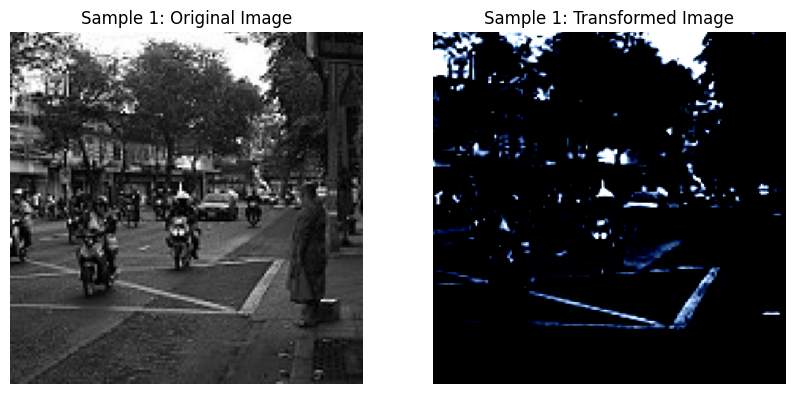

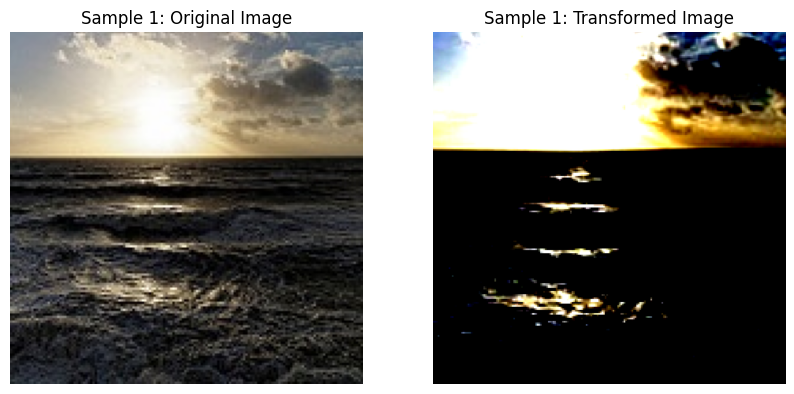

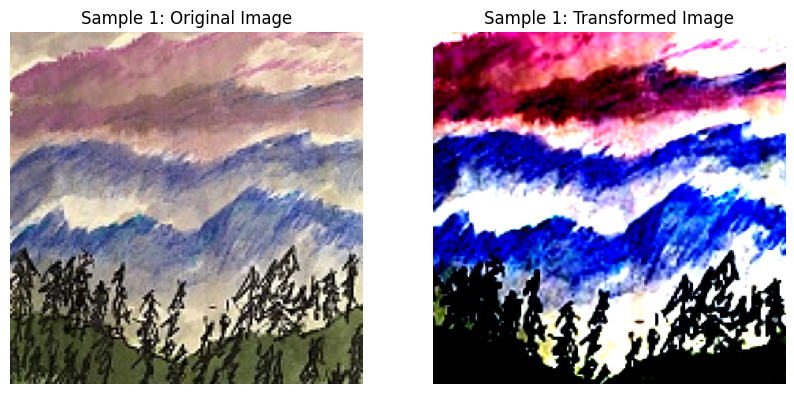

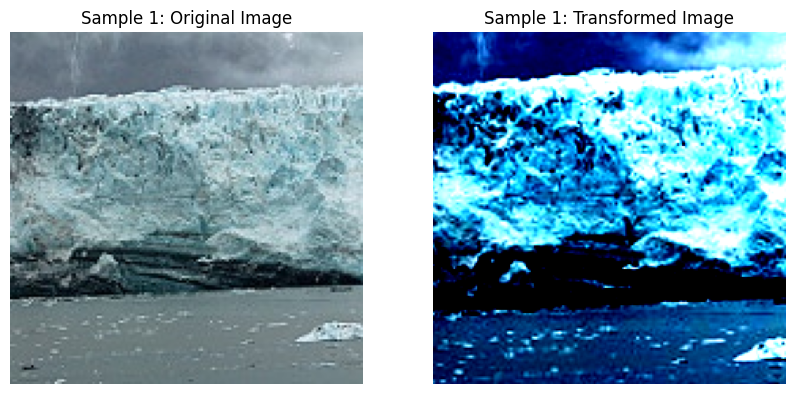

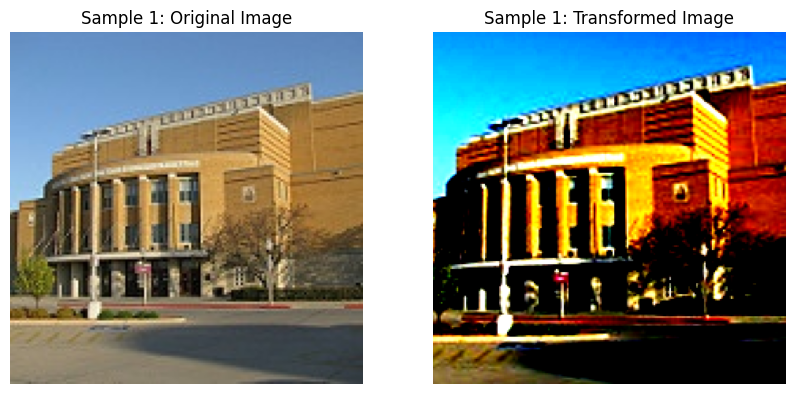

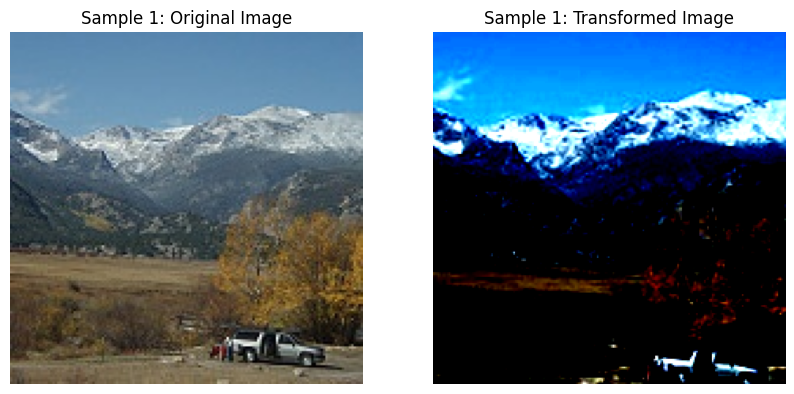

In [63]:
get_pred_class(model, 5, device)